In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler,OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression,LinearRegression
from sklearn.ensemble import ExtraTreesClassifier,RandomForestClassifier,GradientBoostingClassifier,ExtraTreesRegressor,RandomForestRegressor,GradientBoostingRegressor
from sklearn.neighbors import KNeighborsClassifier,KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier,DecisionTreeRegressor
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV

In [3]:
df=pd.read_csv('C:/Users/Admin/OneDrive/Desktop/EDUCATION/DATA SET_DATATRAINED/weatherAUS.csv')
print('(ROW,COLUMN:::::::::',df.shape,')')
print('=============================')
print('COLUMN NAMES--------',df.columns)

(ROW,COLUMN::::::::: (8425, 23) )
COLUMN NAMES-------- Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')


In [4]:
df.head(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [5]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [6]:
for i in df:
    un=df[i].unique().size
    print(i,un)

Date 3004
Location 12
MinTemp 286
MaxTemp 332
Rainfall 251
Evaporation 117
Sunshine 141
WindGustDir 17
WindGustSpeed 53
WindDir9am 17
WindDir3pm 17
WindSpeed9am 35
WindSpeed3pm 36
Humidity9am 91
Humidity3pm 95
Pressure9am 385
Pressure3pm 375
Cloud9am 10
Cloud3pm 10
Temp9am 305
Temp3pm 329
RainToday 3
RainTomorrow 3


## DEALING WITH NULL VAUES

In [7]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [8]:
## All column having Null and float data type, null has been replaced by mean value.
for i in df:
    if df[i].dtypes=='float64':
        if df[i].isnull().sum()>0:
            df[i]=df[i].fillna(np.mean(df[i]))
        else:pass
    else:pass        

In [9]:
## Data distribution of object column-
for i in df:
    if df[i].dtypes==object:
        if df[i].isnull().sum()>0:
            a=df[i].value_counts().sort_values()
            print(i,a)
        else:pass
    else:pass  
## we will take the value which has lowest number of occurance to avoid biasness          

WindGustDir NNW    219
ESE    302
NNE    343
NE     353
NW     383
SSW    396
ENE    415
SE     484
WSW    504
W      507
WNW    531
E      557
SW     572
S      577
SSE    578
N      713
Name: WindGustDir, dtype: int64
WindDir9am ESE    253
NNW    280
SSE    365
E      380
S      402
NE     409
W      414
NNE    430
ENE    433
SSW    467
WNW    480
SE     505
WSW    543
NW     625
SW     704
N      906
Name: WindDir9am, dtype: int64
WindDir3pm NNW    306
NNE    365
SSW    370
ENE    417
E      460
W      462
ESE    462
NW     468
WNW    487
SW     494
N      524
NE     544
WSW    580
SSE    623
S      742
SE     813
Name: WindDir3pm, dtype: int64
RainToday Yes    1990
No     6195
Name: RainToday, dtype: int64
RainTomorrow Yes    1991
No     6195
Name: RainTomorrow, dtype: int64


In [10]:
#### we will take the value which has lowest number of occurance to avoid biasness:          
df['WindGustDir']=df['WindGustDir'].fillna('NW')
df['WindDir9am']=df['WindDir9am'].fillna('ESE')
df['WindDir3pm']=df['WindDir3pm'].fillna('NW')
df['RainToday']=df['RainToday'].fillna('Yes')
df['RainTomorrow']=df['RainTomorrow'].fillna('Yes')

## GRAPHICAL AND NON GRAPHICAL ANALYSIS

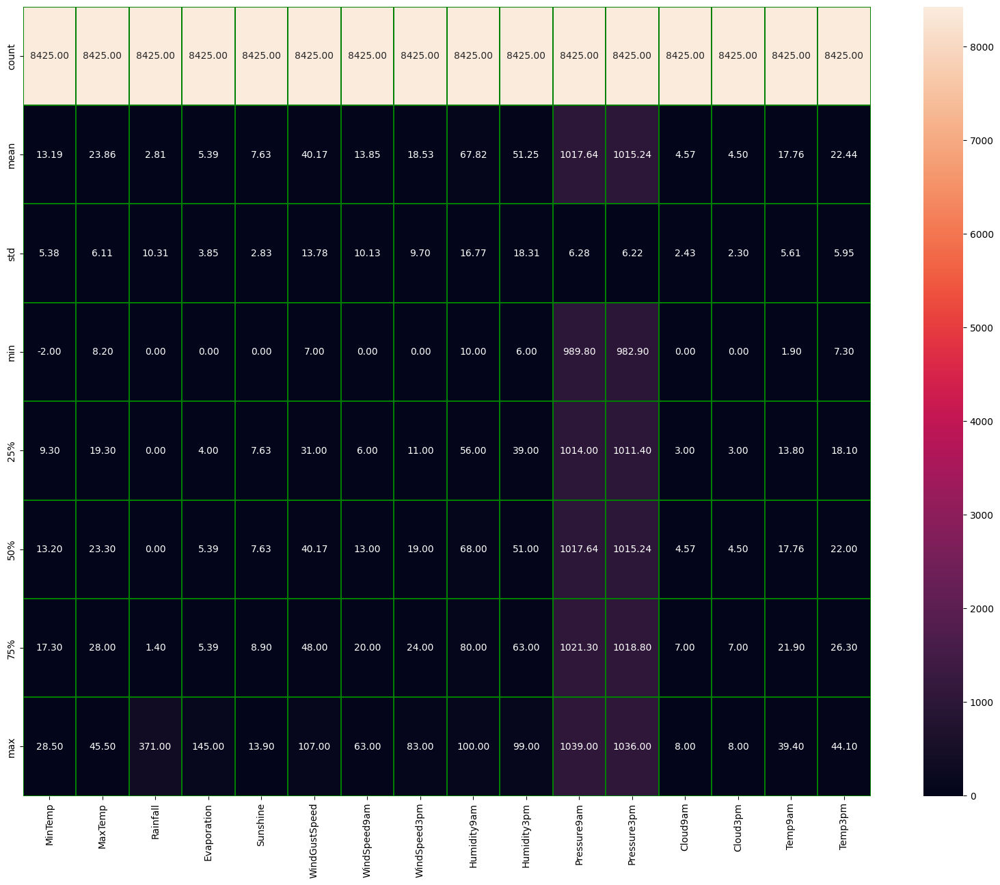

In [11]:
plt.figure(figsize=(20,15))
df.describe()
sns.heatmap(df.describe(),annot=True,fmt='0.2f',linecolor='green',linewidths='0.2')
plt.show()

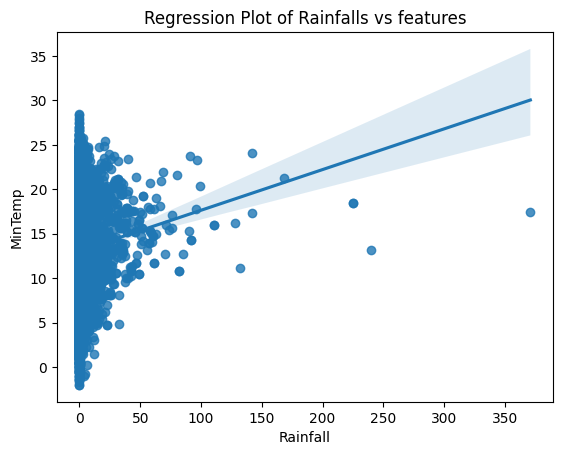

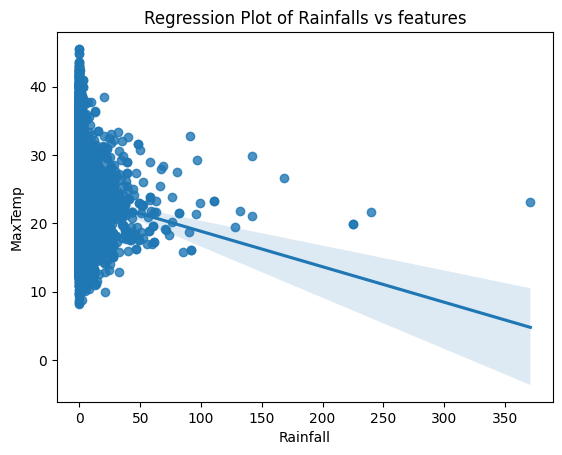

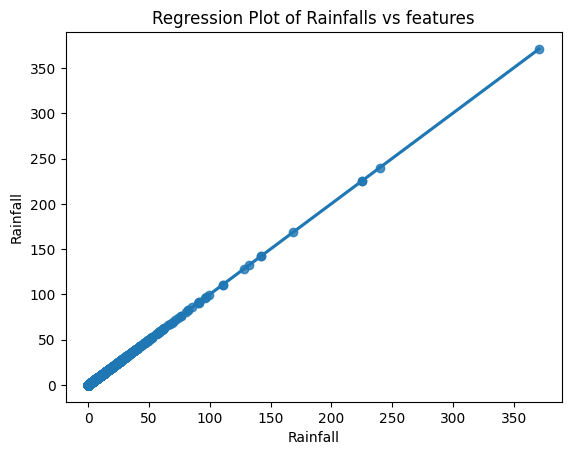

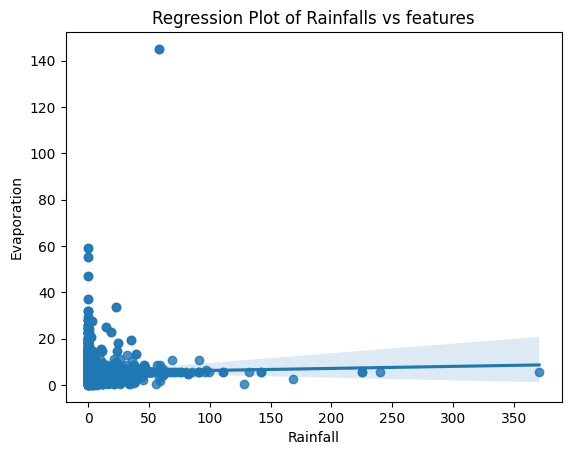

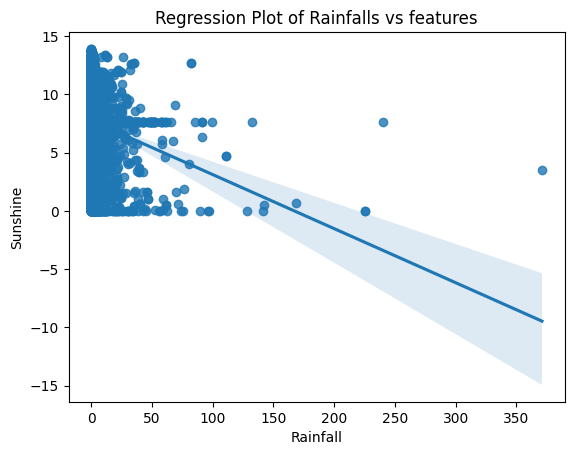

...

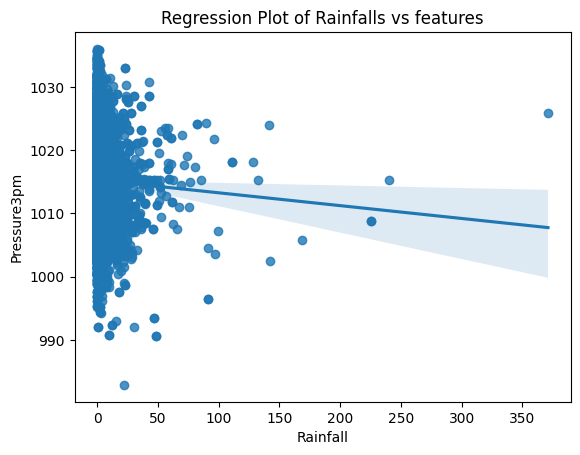

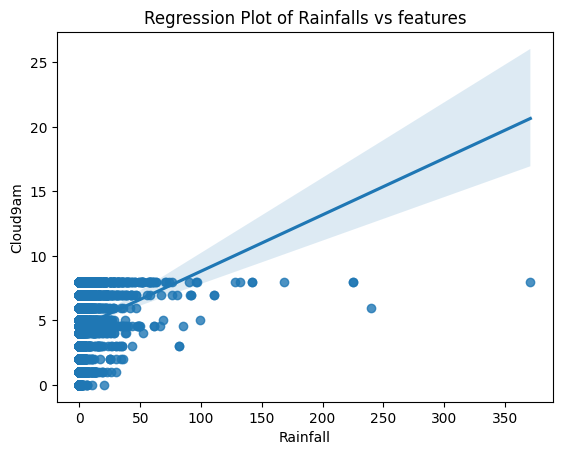

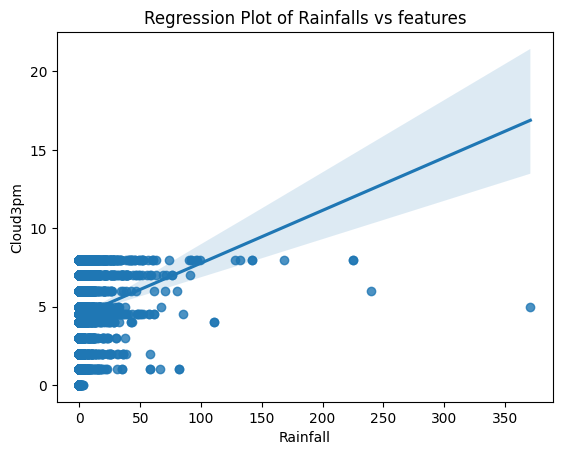

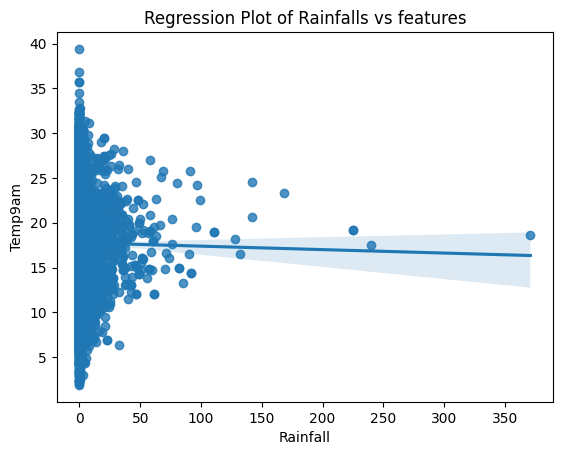

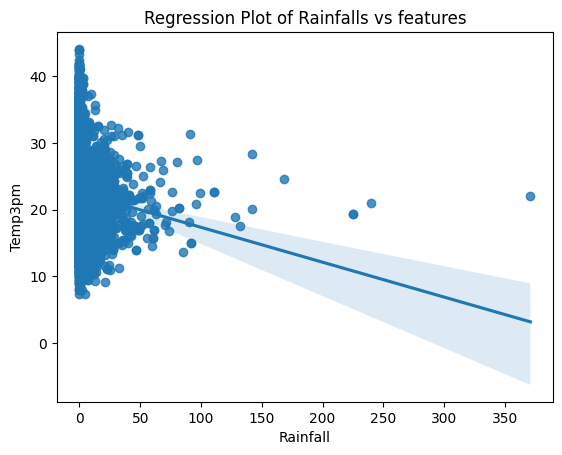

In [12]:
for i in df:
    if df[i].dtype=='float64':
        sns.regplot(df,x='Rainfall',y=i)
        plt.title('Regression Plot of Rainfalls vs features')
        plt.show()
    else: pass    

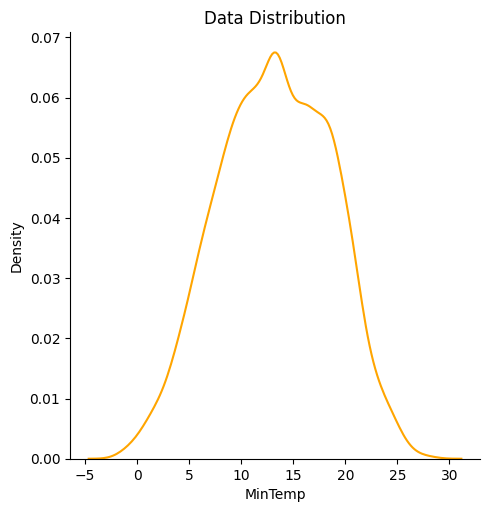

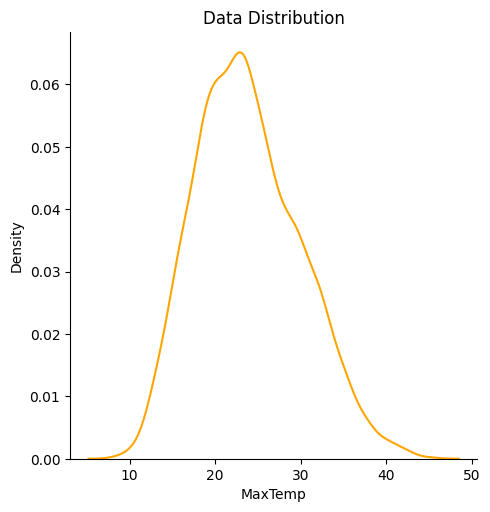

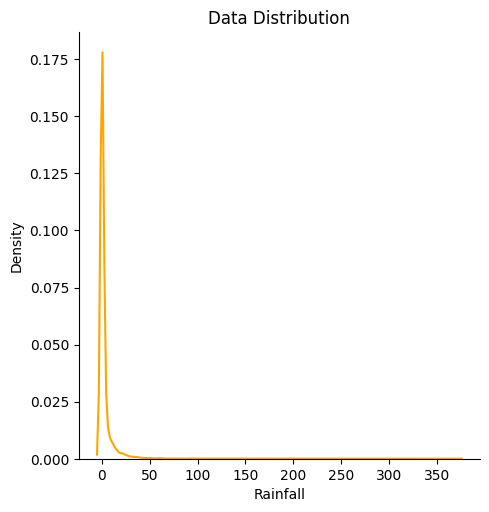

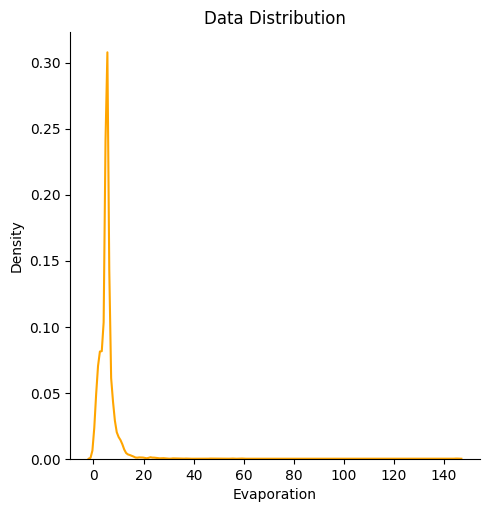

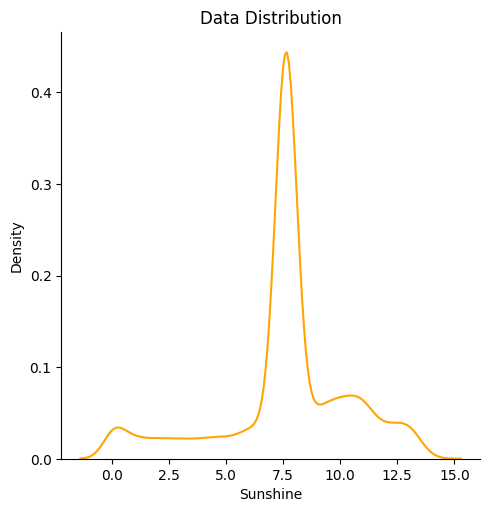

...

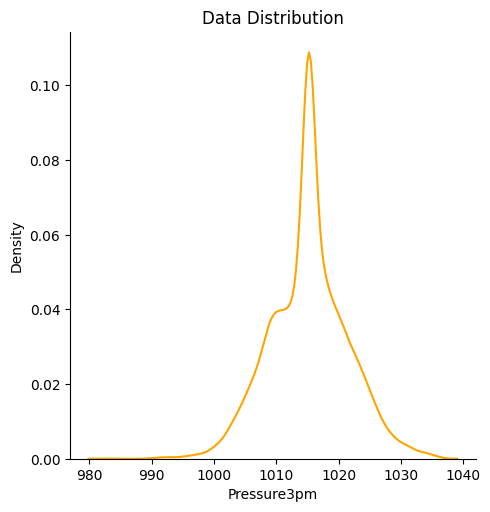

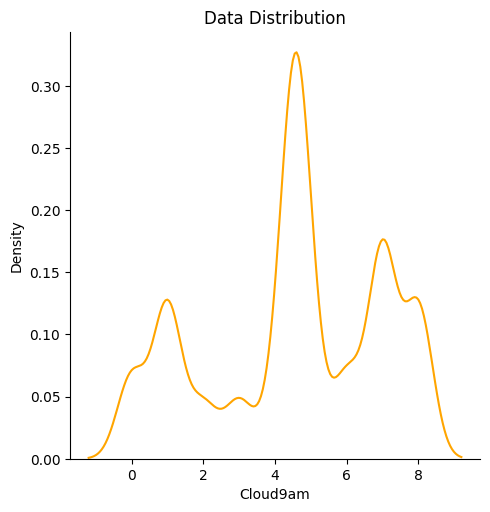

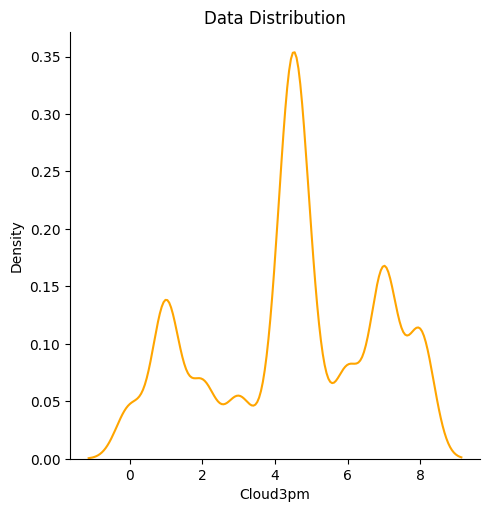

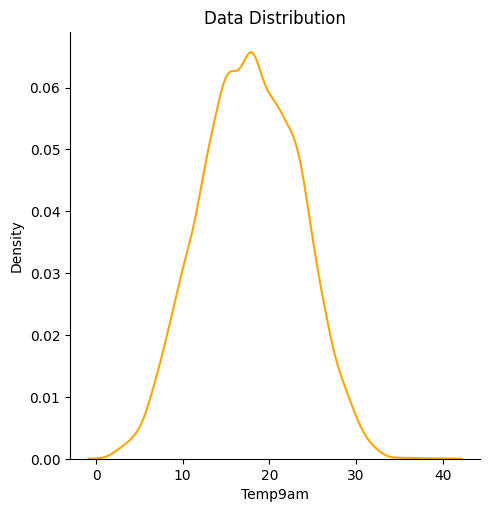

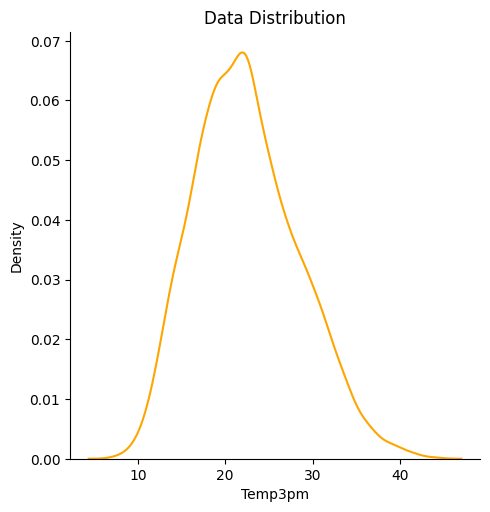

In [13]:
for i in df:
    if df[i].dtype=='float64':
        sns.displot(df,x=i,kind='kde',color='orange')
        plt.title('Data Distribution')
        plt.show()
    else: pass   

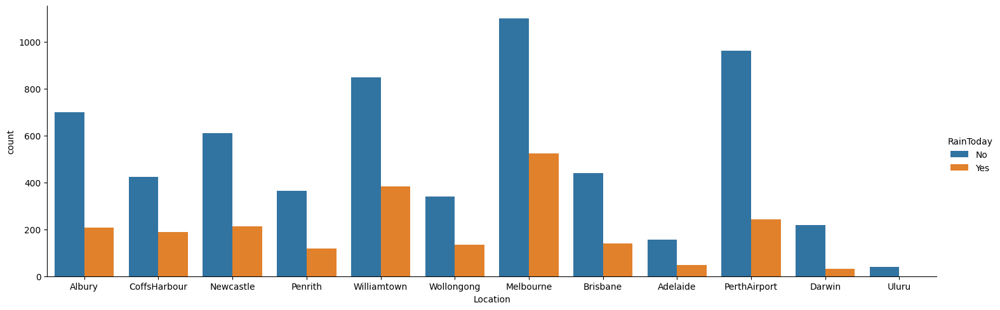

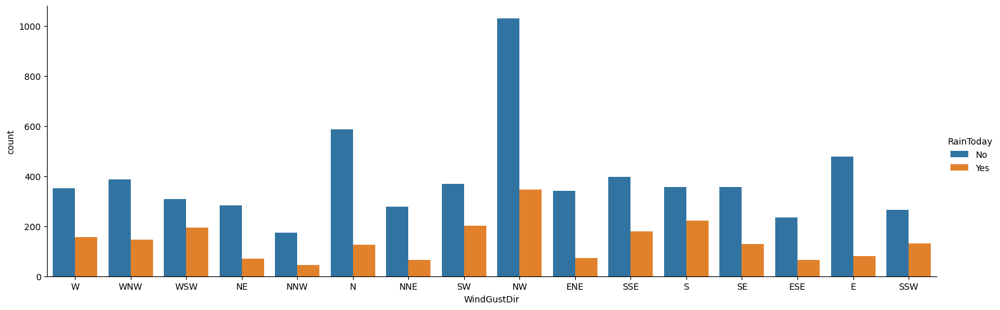

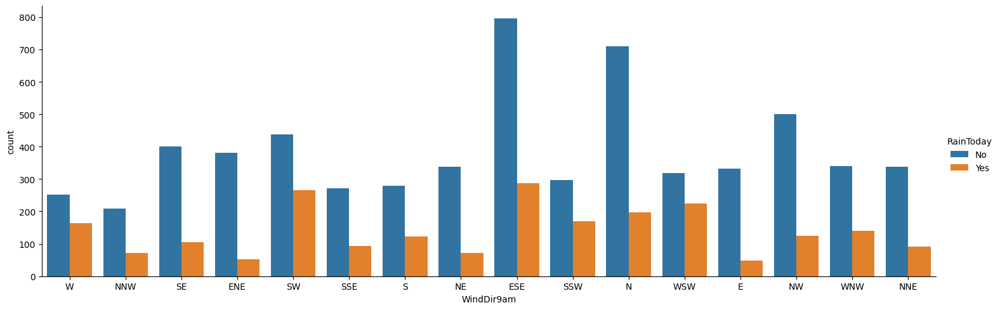

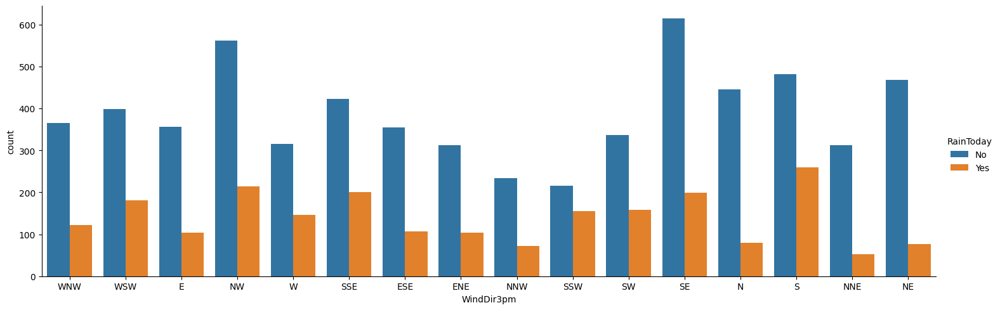

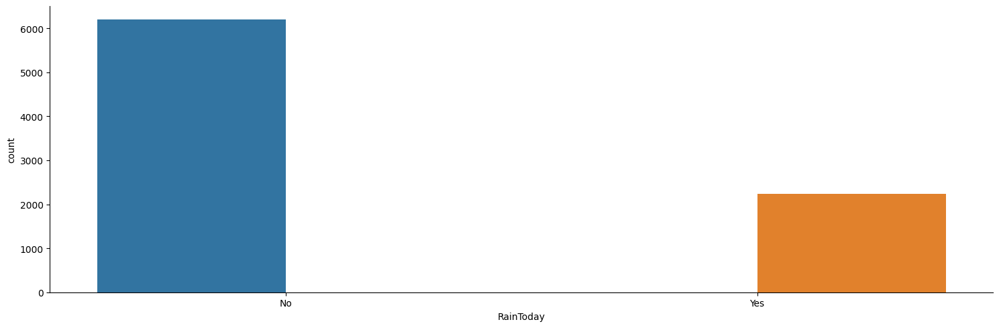

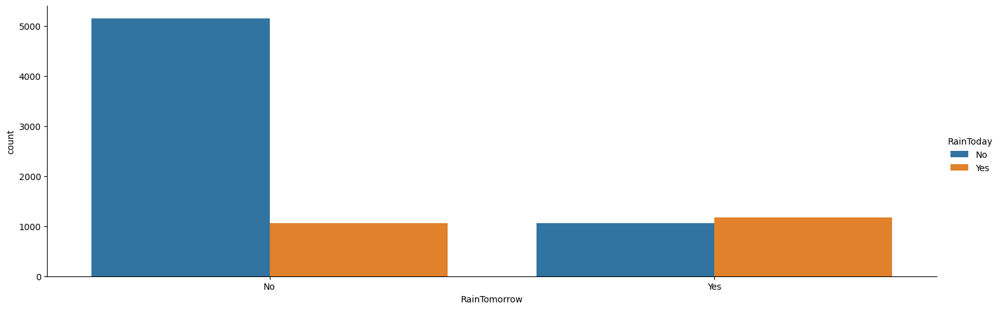

In [14]:
for i in df:
    if df[i].dtype==object:
        if df[i].unique().size <20:
            sns.catplot(df,x=i,kind='count',hue='RainToday',height=5,aspect=3)
            plt.show()
        else:pass
    else:pass
            


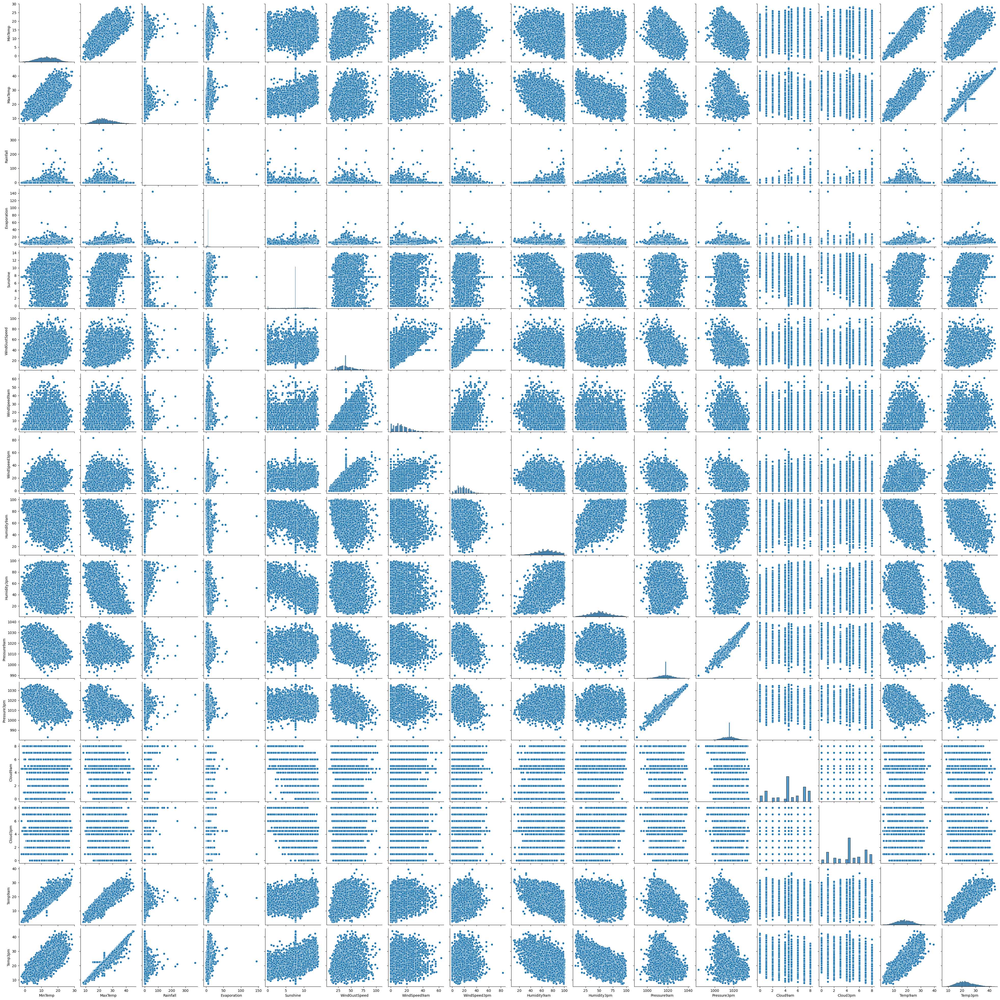

In [15]:
sns.pairplot(df)
plt.show()

In [16]:
## Transforming the object value into numaric value:
oe=OrdinalEncoder()
for column in df:
    if df[column].dtype==object:
        oe=OrdinalEncoder()
        df[column]=oe.fit_transform(df[column].values.reshape(-1,1))
    else:pass 
print(df)

        Date  Location  MinTemp    MaxTemp  Rainfall  Evaporation  Sunshine  \
0        0.0       1.0     13.4  22.900000       0.6     5.389395  7.632205   
1        1.0       1.0      7.4  25.100000       0.0     5.389395  7.632205   
2        2.0       1.0     12.9  25.700000       0.0     5.389395  7.632205   
3        3.0       1.0      9.2  28.000000       0.0     5.389395  7.632205   
4        4.0       1.0     17.5  32.300000       1.0     5.389395  7.632205   
...      ...       ...      ...        ...       ...          ...       ...   
8420  2999.0       9.0      2.8  23.400000       0.0     5.389395  7.632205   
8421  3000.0       9.0      3.6  25.300000       0.0     5.389395  7.632205   
8422  3001.0       9.0      5.4  26.900000       0.0     5.389395  7.632205   
8423  3002.0       9.0      7.8  27.000000       0.0     5.389395  7.632205   
8424  3003.0       9.0     14.9  23.859976       0.0     5.389395  7.632205   

      WindGustDir  WindGustSpeed  WindDir9am  ...  

In [17]:
## Analysis the skew ness and modification
for i in df:
    x=df[i].skew()
    if x>=5:
        df[i]=np.cbrt(df[i])
    else:pass 
print('modified skewness of "df_data" is:')
print('=======================================')
print(df.skew())

modified skewness of "df_data" is:
Date             0.386560
Location        -0.050456
MinTemp         -0.089989
MaxTemp          0.380654
Rainfall         1.622698
Evaporation      0.176211
Sunshine        -0.716525
WindGustDir     -0.077114
WindGustSpeed    0.757000
WindDir9am       0.159572
WindDir3pm      -0.071515
WindSpeed9am     0.960591
WindSpeed3pm     0.494217
Humidity9am     -0.256743
Humidity3pm      0.118281
Pressure9am     -0.024082
Pressure3pm     -0.010214
Cloud9am        -0.366503
Cloud3pm        -0.276294
Temp9am         -0.014748
Temp3pm          0.397331
RainToday        1.066958
RainTomorrow     1.066958
dtype: float64


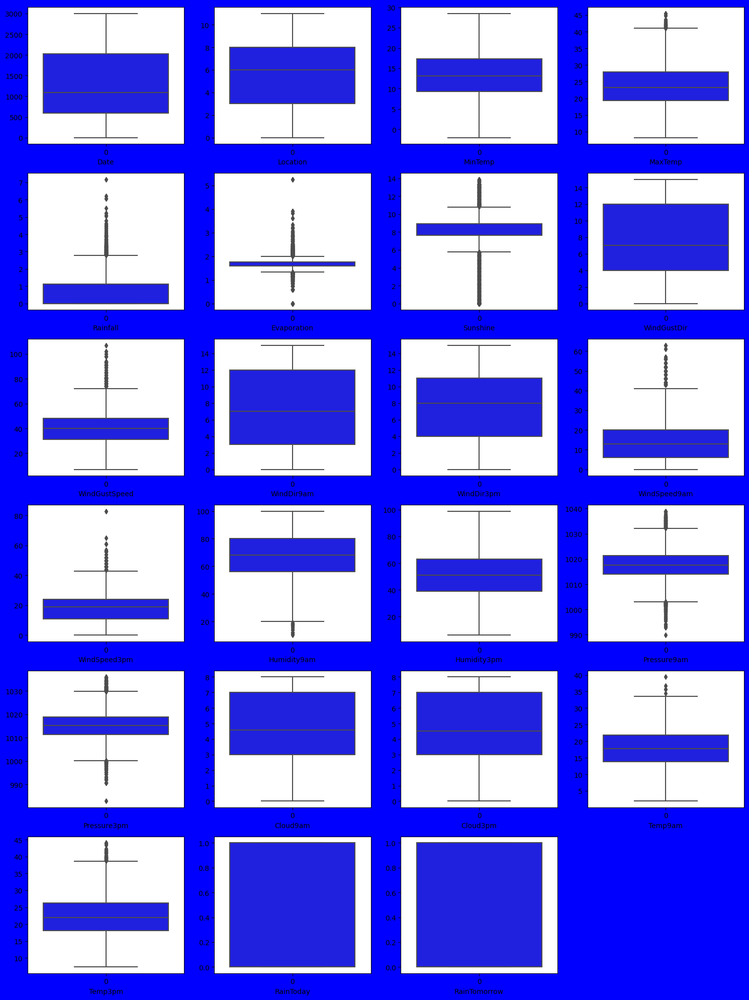

In [18]:
plt.figure(figsize=(15,20),facecolor='blue')
plotnumber=1
for column in df:
    plt.subplot(6,4,plotnumber)
    sns.boxplot(df[column],color='blue')
    plt.xlabel(column)
    plotnumber+=1
plt.tight_layout()

In [19]:
from scipy.stats import zscore
columns=df.columns
out_lier=df[columns]
z=np.abs(zscore(out_lier))
## Removing outlier
df_z=df[(z<3).all(axis=1)]
print('## dataloss:')
print((df.shape[0]-df_z.shape[0])/(df.shape[0])*100)

## dataloss:
5.483679525222552


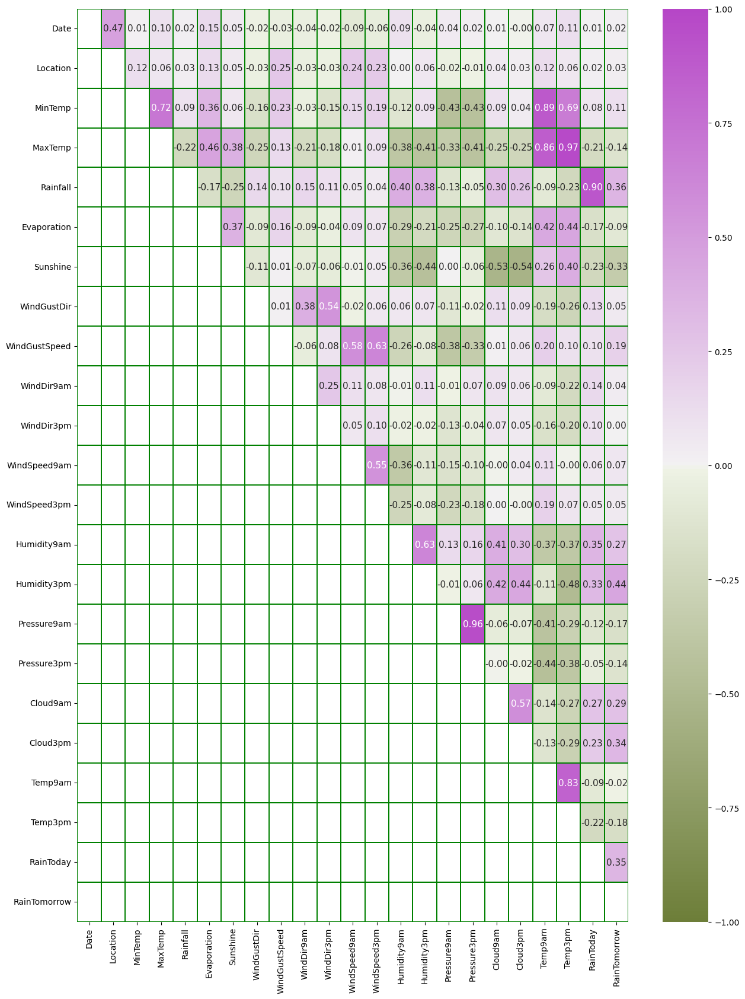

In [20]:
v=df_z.corr()
plt.figure(figsize=(15,20))
mask=np.zeros_like(v)
mask[np.tril_indices_from(mask)]=True
sns.heatmap(v,vmax=1,vmin=-1,annot=True,annot_kws={'fontsize':11},fmt='0.2f',linewidths=0.2,linecolor='green',mask=mask,cmap=sns.diverging_palette(100,300,as_cmap=True))
plt.show()

## CLASSIFICATION ANALYSIS WITH 'RAINTOMORROW PREDICTION'

In [21]:
## Feature and label selection
x=df_z.drop(columns='RainTomorrow')
y=df_z['RainTomorrow']

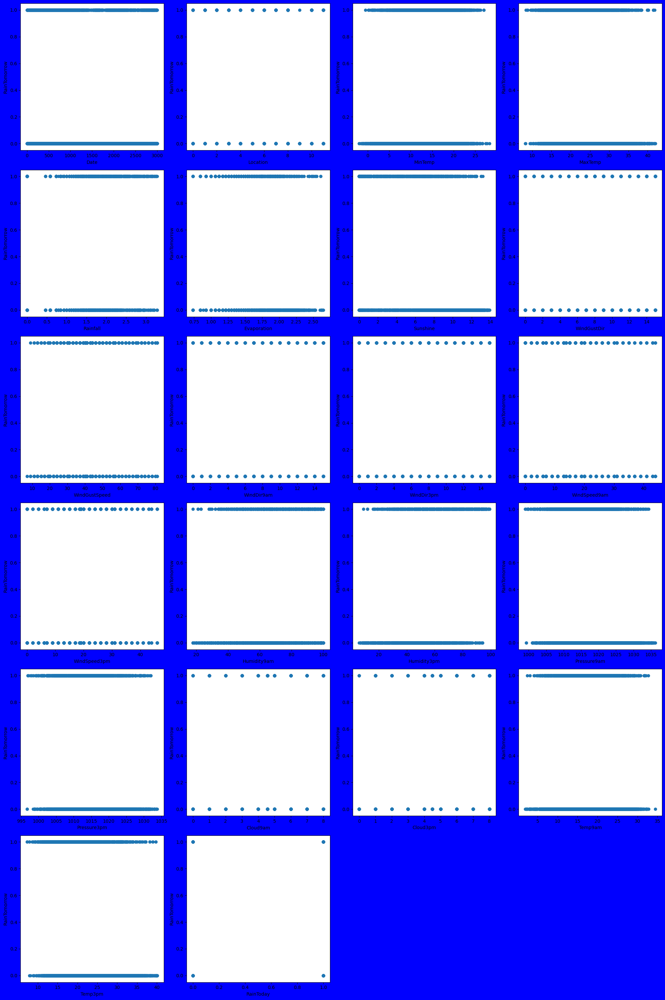

In [22]:
plt.figure(figsize=(20,30), facecolor= 'blue')
plotnumber=1
for column in x:
    if plotnumber <=22:
        plt.subplot(6,4,plotnumber)
        plt.scatter(x[column],y)
        plt.xlabel(column)
        plt.ylabel('RainTomorrow')
        plotnumber+=1
plt.tight_layout()

In [23]:
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(x,i)for i in range(x.shape[1])]
vif['feature']=x.columns
vif

,vif,feature
0,4.882645,Date
1,6.623674,Location
2,59.570473,MinTemp
3,435.580852,MaxTemp
4,8.286037,Rainfall
5,57.419038,Evaporation
6,16.789991,Sunshine
7,6.545572,WindGustDir
8,22.326712,WindGustSpeed
9,4.475760,WindDir9am


In [24]:
x=x.drop(columns='Pressure9am')

In [25]:
sc=StandardScaler()
x_scaled=sc.fit_transform(x)

In [26]:
print('sample distribution before SMOTE:',y.value_counts())

sample distribution before SMOTE: 0.0    5925
1.0    2038
Name: RainTomorrow, dtype: int64


In [27]:
sm=SMOTE()
x1,y1=sm.fit_resample(x,y)
print('sample distribution after SMOTE:',y1.value_counts())

sample distribution after SMOTE: 0.0    5925
1.0    5925
Name: RainTomorrow, dtype: int64


In [28]:
max_accuracy=0
max_rs=0
for i in range (300):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=i)
    LG=LogisticRegression()
    LG.fit(x_train,y_train)
    pred=LG.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc > max_accuracy:
        max_accuracy=acc
        max_rs=i

print('Maximum accuracy:',max_accuracy, 'on random state:',max_rs)

Maximum accuracy: 0.770745428973277 on random state: 242


In [29]:
x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=max_rs)

In [30]:
DTC=DecisionTreeClassifier()
DTC.fit(x_train,y_train)
P_DTC=DTC.predict(x_test)
P_DTC_T=DTC.predict(x_train)
score_DTC=cross_val_score(DTC,x_test,y_test)
acc_dtc=accuracy_score(y_test,P_DTC)
print('classification_report------')
print('*********************************************************************************************************************')
print(classification_report(y_test,P_DTC))
print('cross_val_score=',score_DTC)
print('--------------------------------------------------------------------------------------')
cv_mean_dtc=score_DTC.mean()
print('--------------------------------------------------------------------------------------')
diff_dtc_score=accuracy_score(y_test,P_DTC)-score_DTC.mean()
print('difference between accuracy and cv_score is::',diff_dtc_score)

classification_report------
*********************************************************************************************************************
              precision    recall  f1-score   support

         0.0       0.88      0.85      0.86      1769
         1.0       0.86      0.88      0.87      1786

    accuracy                           0.87      3555
   macro avg       0.87      0.87      0.87      3555
weighted avg       0.87      0.87      0.87      3555

cross_val_score= [0.81293952 0.79324895 0.79606188 0.78762307 0.81293952]
--------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------
difference between accuracy and cv_score is:: 0.06469760900140642


In [31]:
LG=LogisticRegression()
LG.fit(x_train,y_train)
P_LG=LG.predict(x_test)
P_LG_T=LG.predict(x_train)
score_LG=cross_val_score(LG,x_test,y_test)
acc_LG=accuracy_score(y_test,P_LG)
print('classification_report------')
print('*********************************************************************************************************************')
print(classification_report(y_test,P_LG))
print('cross_val_score=',score_LG)
print('--------------------------------------------------------------------------------------')
cv_mean_LG=score_LG.mean()
print('--------------------------------------------------------------------------------------')
diff_LG_score=accuracy_score(y_test,P_LG)-score_LG.mean()
print('difference between accuracy and cv_score is::',diff_LG_score)

classification_report------
*********************************************************************************************************************
              precision    recall  f1-score   support

         0.0       0.76      0.78      0.77      1769
         1.0       0.78      0.76      0.77      1786

    accuracy                           0.77      3555
   macro avg       0.77      0.77      0.77      3555
weighted avg       0.77      0.77      0.77      3555

cross_val_score= [0.78059072 0.76090014 0.77074543 0.75105485 0.77355837]
--------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------
difference between accuracy and cv_score is:: 0.0033755274261602075


In [32]:
ETC=ExtraTreesClassifier()
ETC.fit(x_train,y_train)
P_ETC=ETC.predict(x_test)
P_ETC_T=ETC.predict(x_train)
score_ETC=cross_val_score(ETC,x_test,y_test)
acc_ETC=accuracy_score(y_test,P_ETC)
print('classification_report------')
print('*********************************************************************************************************************')
print(classification_report(y_test,P_ETC))
print('cross_val_score=',score_ETC)
print('--------------------------------------------------------------------------------------')
cv_mean_etc=score_ETC.mean()
print('--------------------------------------------------------------------------------------')
diff_etc_score=accuracy_score(y_test,P_ETC)-score_ETC.mean()
print('difference between accuracy and cv_score is::',diff_etc_score)

classification_report------
*********************************************************************************************************************
              precision    recall  f1-score   support

         0.0       0.92      0.93      0.93      1769
         1.0       0.93      0.92      0.93      1786

    accuracy                           0.93      3555
   macro avg       0.93      0.93      0.93      3555
weighted avg       0.93      0.93      0.93      3555

cross_val_score= [0.87201125 0.86216596 0.87341772 0.87623066 0.87341772]
--------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------
difference between accuracy and cv_score is:: 0.05485232067510559


In [33]:
GB=GradientBoostingClassifier()
GB.fit(x_train,y_train)
P_GB=GB.predict(x_test)
P_GB_T=GB.predict(x_train)
score_GB=cross_val_score(GB,x_test,y_test)
acc_GB=accuracy_score(y_test,P_GB)
print('classification_report------')
print('*********************************************************************************************************************')
print(classification_report(y_test,P_GB))
print('cross_val_score=',score_GB)
print('--------------------------------------------------------------------------------------')
cv_mean_GB=score_GB.mean()
print('--------------------------------------------------------------------------------------')
diff_GB_score=accuracy_score(y_test,P_GB)-score_GB.mean()
print('difference between accuracy and cv_score is::',diff_GB_score)

classification_report------
*********************************************************************************************************************
              precision    recall  f1-score   support

         0.0       0.85      0.86      0.86      1769
         1.0       0.86      0.85      0.86      1786

    accuracy                           0.86      3555
   macro avg       0.86      0.86      0.86      3555
weighted avg       0.86      0.86      0.86      3555

cross_val_score= [0.85372714 0.84388186 0.84388186 0.85654008 0.86216596]
--------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------
difference between accuracy and cv_score is:: 0.005344585091420551


In [34]:
RF=RandomForestClassifier()
RF.fit(x_train,y_train)
P_RF=RF.predict(x_test)
P_RF_T=RF.predict(x_train)
score_RF=cross_val_score(RF,x_test,y_test)
acc_RF=accuracy_score(y_test,P_RF)
print('classification_report------')
print('*********************************************************************************************************************')
print(classification_report(y_test,P_RF))
print('cross_val_score=',score_RF)
print('--------------------------------------------------------------------------------------')
cv_mean_RF=score_RF.mean()
print('--------------------------------------------------------------------------------------')
diff_RF_score=accuracy_score(y_test,P_RF)-score_RF.mean()
print('difference between accuracy and cv_score is::',diff_RF_score)

classification_report------
*********************************************************************************************************************
              precision    recall  f1-score   support

         0.0       0.91      0.93      0.92      1769
         1.0       0.93      0.91      0.92      1786

    accuracy                           0.92      3555
   macro avg       0.92      0.92      0.92      3555
weighted avg       0.92      0.92      0.92      3555

cross_val_score= [0.87201125 0.86638537 0.8649789  0.87763713 0.86216596]
--------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------
difference between accuracy and cv_score is:: 0.05063291139240511


In [35]:
SV=SVC()
SV.fit(x_train,y_train)
P_SV=SV.predict(x_test)
P_SV_T=SV.predict(x_train)
score_SV=cross_val_score(SV,x_test,y_test)
acc_SV=accuracy_score(y_test,P_SV)
print('classification_report------')
print('*********************************************************************************************************************')
print(classification_report(y_test,P_SV))
print('cross_val_score=',score_SV)
print('--------------------------------------------------------------------------------------')
cv_mean_SV=score_SV.mean()
print('--------------------------------------------------------------------------------------')
diff_SV_score=accuracy_score(y_test,P_SV)-score_SV.mean()
print('difference between accuracy and cv_score is::',diff_SV_score)

classification_report------
*********************************************************************************************************************
              precision    recall  f1-score   support

         0.0       0.74      0.70      0.72      1769
         1.0       0.72      0.75      0.73      1786

    accuracy                           0.73      3555
   macro avg       0.73      0.73      0.73      3555
weighted avg       0.73      0.73      0.73      3555

cross_val_score= [0.63853727 0.62025316 0.63431786 0.61744023 0.63150492]
--------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------
difference between accuracy and cv_score is:: 0.09789029535864979


In [36]:
KN=KNeighborsClassifier()
KN.fit(x_train,y_train)
P_KN=KN.predict(x_test)
P_KN_T=KN.predict(x_train)
score_KN=cross_val_score(KN,x_test,y_test)
acc_KN=accuracy_score(y_test,P_KN)
print('classification_report------')
print('*********************************************************************************************************************')
print(classification_report(y_test,P_KN))
print('cross_val_score=',score_KN)
print('--------------------------------------------------------------------------------------')
cv_mean_KN=score_KN.mean()
print('--------------------------------------------------------------------------------------')
diff_KN_score=accuracy_score(y_test,P_KN)-score_KN.mean()
print('difference between accuracy and cv_score is::',diff_KN_score)

classification_report------
*********************************************************************************************************************
              precision    recall  f1-score   support

         0.0       0.92      0.77      0.84      1769
         1.0       0.81      0.93      0.86      1786

    accuracy                           0.85      3555
   macro avg       0.86      0.85      0.85      3555
weighted avg       0.86      0.85      0.85      3555

cross_val_score= [0.79606188 0.77918425 0.7580872  0.79606188 0.79043601]
--------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------
difference between accuracy and cv_score is:: 0.06947960618846694


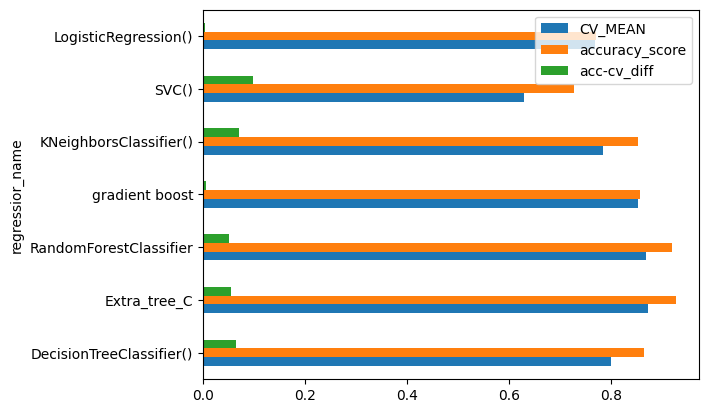

In [37]:
ml_compare=pd.DataFrame()
DT_C={'regressior_name':DTC,'CV_MEAN':cv_mean_dtc,'accuracy_score':acc_dtc,'acc-cv_diff':diff_dtc_score}
ET_C={'regressior_name':'Extra_tree_C','CV_MEAN':cv_mean_etc,'accuracy_score':acc_ETC,'acc-cv_diff':diff_etc_score}
RF_C={'regressior_name':'RandomForestClassifier','CV_MEAN':cv_mean_RF,'accuracy_score':acc_RF,'acc-cv_diff':diff_RF_score}
GB_C={'regressior_name':'gradient boost','CV_MEAN':cv_mean_GB,'accuracy_score':acc_GB,'acc-cv_diff':diff_GB_score}
KNN_C={'regressior_name':KN,'CV_MEAN':cv_mean_KN,'accuracy_score':acc_KN,'acc-cv_diff':diff_KN_score}
SV_C={'regressior_name':SV,'CV_MEAN':cv_mean_SV,'accuracy_score':acc_SV,'acc-cv_diff':diff_SV_score}
LG_C={'regressior_name':LG,'CV_MEAN':cv_mean_LG,'accuracy_score':acc_LG,'acc-cv_diff':diff_LG_score}
ml_compare=ml_compare.append([DT_C,ET_C,RF_C,GB_C,KNN_C,SV_C,LG_C],ignore_index=True)
ml_compare=ml_compare.set_index(['regressior_name'])
ml_compare.plot.barh()
plt.show()

In [38]:
p1={'criterion':['entropy','gini','log_loss'],'n_estimators':[100],'random_state':[100,150,200]}
GCV=GridSearchCV(ExtraTreesClassifier(),param_grid=p1,cv=5)
final=GCV.fit(x_train,y_train)
print(final.best_params_)

{'criterion': 'gini', 'n_estimators': 100, 'random_state': 200}


In [39]:
final_model_classification=ExtraTreesClassifier(
criterion= 'entropy',n_estimators=100, 
random_state=100)
final_model_classification.fit(x_train,y_train)
pred=final_model_classification.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

92.63009845288326


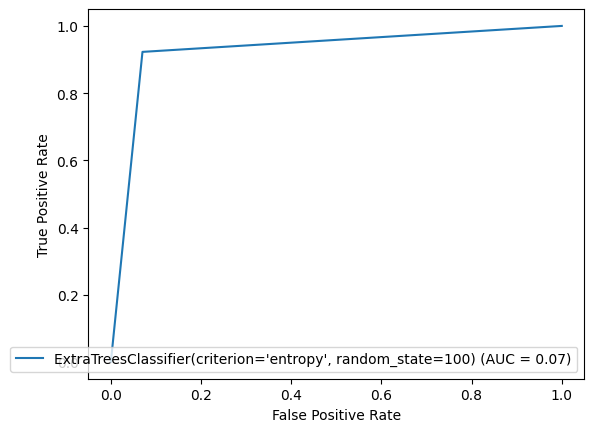

In [40]:
from sklearn import metrics
fpr,tpr,thresolds=metrics.roc_curve(y_test,pred,pos_label=1)
roc_auc=metrics.auc(tpr,fpr)
display=metrics.RocCurveDisplay(fpr=fpr,tpr=tpr,roc_auc=roc_auc,estimator_name=final_model_classification)
display.plot()

In [41]:
import pickle
file_name='Rainfall_occurance.pkl'
pickle.dump(final_model_classification,open(file_name,'wb'))

## REGRESSION ANALYSIS OF 'RAIN FALL AMOUNT

In [42]:
x=df.drop(columns='Rainfall')
y=df['Rainfall']

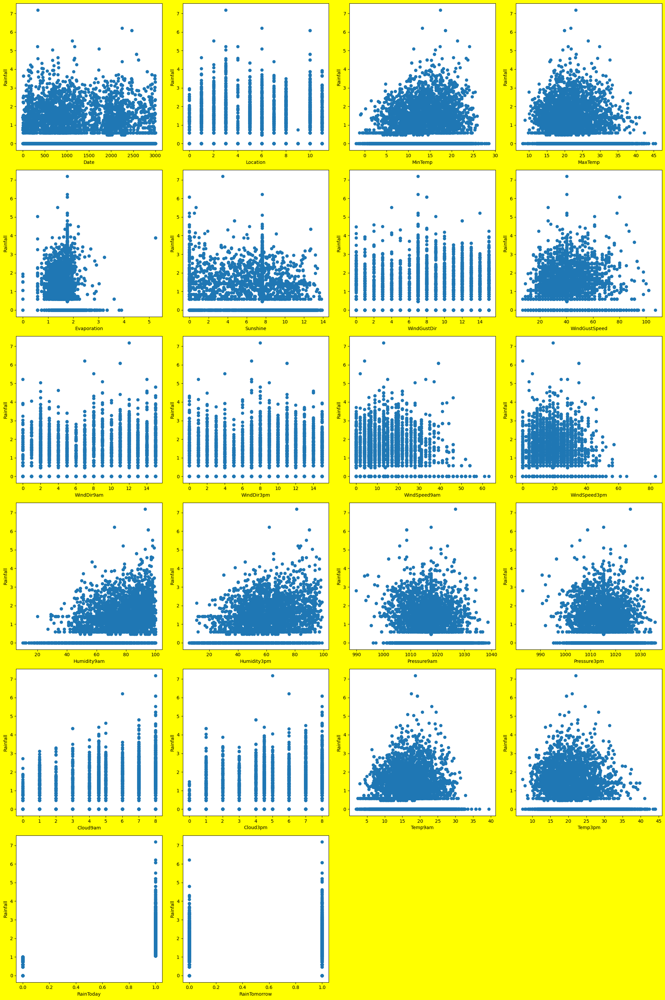

In [43]:
plt.figure(figsize=(20,30), facecolor= 'yellow')
plotnumber=1
for column in x:
    if plotnumber <=24:
        plt.subplot(6,4,plotnumber)
        plt.scatter(x[column],y)
        plt.xlabel(column)
        plt.ylabel('Rainfall')
        plotnumber+=1
plt.tight_layout() 

In [44]:
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(x,i)for i in range(x.shape[1])]
vif['feature']=x.columns
vif

,vif,feature
0,4.903685,Date
1,6.664952,Location
2,58.350466,MinTemp
3,425.364500,MaxTemp
4,41.897239,Evaporation
5,16.133830,Sunshine
6,6.521040,WindGustDir
7,21.777440,WindGustSpeed
8,4.433188,WindDir9am
9,6.201668,WindDir3pm


In [45]:
x=x.drop(columns='Pressure9am')

In [46]:
sc=StandardScaler()
x_scaled=sc.fit_transform(x)

In [47]:
max_accuracy=0
max_rs=0
for i in range (300):
    x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.30,random_state=i)
    LR=LinearRegression()
    LR.fit(x_train,y_train)
    pred=LR.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc > max_accuracy:
        max_accuracy=acc
        max_rs=i

print('Maximum accuracy:',max_accuracy, 'on random state:',max_rs)

Maximum accuracy: 0.8097819712308696 on random state: 154


In [48]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.30,random_state=max_rs)

In [49]:
LR=LinearRegression()
LR.fit(x_train,y_train)
pred_LR=LR.predict(x_test)
pred_LR_train=LR.predict(x_train)
r2t_LR=r2_score(y_test,pred_LR)
r2tr_LR=r2_score(y_train,pred_LR_train)
mab_error_LR=mean_absolute_error(y_test,pred_LR)
msq_error_LR=mean_squared_error(y_test,pred_LR)
root_error_LR=np.sqrt(mean_squared_error(y_test,pred_LR))
cv_score_LR=cross_val_score(LR,x,y,cv=5,scoring='r2')
print('cv_score',cv_score_LR)
print('avg:',cv_score_LR.mean())
r2_cv_LR=r2_score(y_test,pred_LR)-cv_score_LR.mean()

cv_score [0.77270457 0.76372017 0.77978099 0.78244857 0.82405501]
avg: 0.7845418633150946


In [50]:
DTR=DecisionTreeRegressor()
DTR.fit(x_train,y_train)
pred_DTR=DTR.predict(x_test)
pred_DTR_train=DTR.predict(x_train)
r2t_DTR=r2_score(y_test,pred_DTR)
r2tr_DTR=r2_score(y_train,pred_DTR_train)
mab_error_DTR=mean_absolute_error(y_test,pred_DTR)
msq_error_DTR=mean_squared_error(y_test,pred_DTR)
root_error_DTR=np.sqrt(mean_squared_error(y_test,pred_DTR))
cv_score_DTR=cross_val_score(DTR,x,y,cv=5,scoring='r2')
print('cv_score',cv_score_DTR)
print('avg:',cv_score_DTR.mean())
r2_cv_DTR=r2_score(y_test,pred_DTR)-cv_score_DTR.mean()

cv_score [0.6116919  0.74998553 0.78547866 0.65744757 0.59829998]
avg: 0.680580728241169


In [51]:
ETR=ExtraTreesRegressor()
ETR.fit(x_train,y_train)
pred_ETR=ETR.predict(x_test)
pred_ETR_train=ETR.predict(x_train)
r2t_ETR=r2_score(y_test,pred_ETR)
r2tr_ETR=r2_score(y_train,pred_ETR_train)
mab_error_ETR=mean_absolute_error(y_test,pred_ETR)
msq_error_ETR=mean_squared_error(y_test,pred_ETR)
root_error_ETR=np.sqrt(mean_squared_error(y_test,pred_ETR))
cv_score_ETR=cross_val_score(ETR,x,y,cv=5,scoring='r2')
print('cv_score',cv_score_ETR)
print('avg:',cv_score_ETR.mean())
r2_cv_ETR=r2_score(y_test,pred_ETR)-cv_score_ETR.mean()

cv_score [0.7864751  0.84377683 0.9077176  0.83777813 0.83438679]
avg: 0.8420268888283526


In [52]:
GBR=GradientBoostingRegressor()
GBR.fit(x_train,y_train)
pred_GBR=GBR.predict(x_test)
pred_GBR_train=GBR.predict(x_train)
r2t_GBR=r2_score(y_test,pred_GBR)
r2tr_GBR=r2_score(y_train,pred_GBR_train)
mab_error_GBR=mean_absolute_error(y_test,pred_GBR)
msq_error_GBR=mean_squared_error(y_test,pred_GBR)
root_error_GBR=np.sqrt(mean_squared_error(y_test,pred_GBR))
cv_score_GBR=cross_val_score(GBR,x,y,cv=5,scoring='r2')
print('cv_score',cv_score_GBR)
print('avg:',cv_score_GBR.mean())
r2_cv_GBR=r2_score(y_test,pred_GBR)-cv_score_GBR.mean()

cv_score [0.79451771 0.78780632 0.82082462 0.80276601 0.83408586]
avg: 0.8080001067111902


In [53]:
KNR=KNeighborsRegressor()
KNR.fit(x_train,y_train)
pred_KNR=KNR.predict(x_test)
pred_KNR_train=KNR.predict(x_train)
r2t_KNR=r2_score(y_test,pred_KNR)
r2tr_KNR=r2_score(y_train,pred_KNR_train)
mab_error_KNR=mean_absolute_error(y_test,pred_KNR)
msq_error_KNR=mean_squared_error(y_test,pred_KNR)
root_error_KNR=np.sqrt(mean_squared_error(y_test,pred_KNR))
cv_score_KNR=cross_val_score(KNR,x,y,cv=5,scoring='r2')
print('cv_score',cv_score_KNR)
print('avg:',cv_score_KNR.mean())
r2_cv_KNR=r2_score(y_test,pred_KNR)-cv_score_KNR.mean()

cv_score [0.14796397 0.02081917 0.27717371 0.23594399 0.11358758]
avg: 0.15909768379373596


In [54]:
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)
pred_RFR=RFR.predict(x_test)
pred_RFR_train=RFR.predict(x_train)
r2t_RFR=r2_score(y_test,pred_RFR)
r2tr_RFR=r2_score(y_train,pred_RFR_train)
mab_error_RFR=mean_absolute_error(y_test,pred_RFR)
msq_error_RFR=mean_squared_error(y_test,pred_RFR)
root_error_RFR=np.sqrt(mean_squared_error(y_test,pred_RFR))
cv_score_RFR=cross_val_score(RFR,x,y,cv=5,scoring='r2')
print('cv_score',cv_score_RFR)
print('avg:',cv_score_RFR.mean())
r2_cv_RFR=r2_score(y_test,pred_RFR)-cv_score_RFR.mean()

cv_score [0.78158887 0.82321959 0.88534314 0.83674718 0.83518962]
avg: 0.8324176797867672


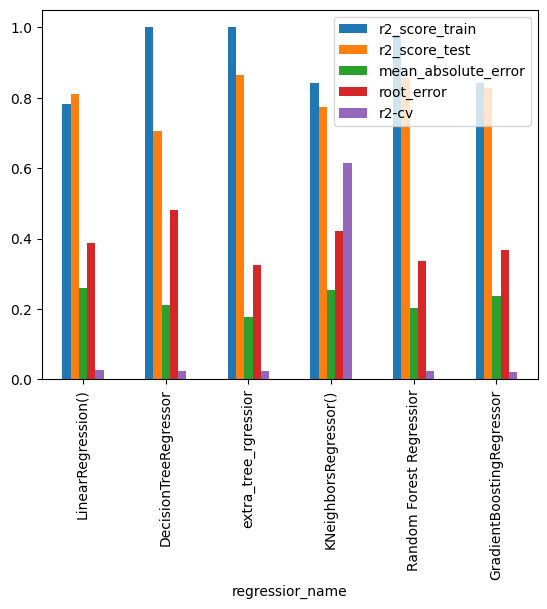

In [55]:
ml_compare=pd.DataFrame()
data1={'regressior_name':LR,'r2_score_train':r2tr_LR,'r2_score_test':r2t_LR,'mean_absolute_error':mab_error_LR,'root_error':root_error_LR,'r2-cv':r2_cv_LR}
data2={'regressior_name':'DecisionTreeRegressor','r2_score_train':r2tr_DTR,'r2_score_test':r2t_DTR,'mean_absolute_error':mab_error_DTR,'root_error':root_error_DTR,'r2-cv':r2_cv_DTR}
data3={'regressior_name':'extra_tree_rgressior','r2_score_train':r2tr_ETR,'r2_score_test':r2t_ETR,'mean_absolute_error':mab_error_ETR,'root_error':root_error_ETR,'r2-cv':r2_cv_ETR}
data4={'regressior_name':KNR,'r2_score_train':r2tr_KNR,'r2_score_test':r2t_KNR,'mean_absolute_error':mab_error_KNR,'root_error':root_error_KNR,'r2-cv':r2_cv_KNR}
data5={'regressior_name':'Random Forest Regressior','r2_score_train':r2tr_RFR,'r2_score_test':r2t_RFR,'mean_absolute_error':mab_error_RFR,'root_error':root_error_RFR,'r2-cv':r2_cv_RFR}
data6={'regressior_name':'GradientBoostingRegressor','r2_score_train':r2tr_GBR,'r2_score_test':r2t_GBR,'mean_absolute_error':mab_error_GBR,'root_error':root_error_GBR,'r2-cv':r2_cv_GBR}
ml_compare=ml_compare.append([data1,data2,data3,data4,data5,data6],ignore_index=True)
ml_compare=ml_compare.set_index(['regressior_name'])
ml_compare.plot.bar()
plt.show()

In [56]:
pr={'criterion':['absolute_error','friedman_mse','poisson','squared_error'],'min_samples_split':[2]}
GCV=GridSearchCV(DecisionTreeRegressor(),param_grid=pr,cv=5)
final=GCV.fit(x_train,y_train)
print(final.best_params_)

{'criterion': 'poisson', 'min_samples_split': 2}


In [57]:
finalmodel_regression=DecisionTreeRegressor(criterion='poisson',min_samples_split=2)
finalmodel_regression.fit(x_train,y_train)
pred_final=finalmodel_regression.predict(x_test)
r2_s=r2_score(y_test,pred_final)
print(r2_s)

0.7017182417531362


In [58]:
import pickle
file_name='Rainfall_quantity_pred.pkl'
pickle.dump(finalmodel_regression,open(file_name,'wb'))